In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import numpy as np
from sklearn.decomposition import PCA
import math

In [4]:
def display_image(data):
    image = cv2.imread(data[0])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    fig,ax = plt.subplots(1)
    ax.imshow(image,  cmap='gray')
    for i in data[1] :
        plt.plot(int(i[0]),int(i[1]), 'b+')
        
    box = get_bounding_box(data[1])
    rectangle = patches.Rectangle((box[0],box[1]),box[2],box[3],linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rectangle)
    
    box = resize_bounding_box(get_bounding_box(data[1]),0.5)
    rectangle = patches.Rectangle((box[0],box[1]),box[2],box[3],linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rectangle)
        
    marks = crop_image(coordinates_to_image(data[1],image.shape),box)
    image = crop_image(image,box)
    plt.figure()
    plt.imshow(image,cmap='gray')
    for i in image_to_coordinates(marks) :
        plt.plot(i[0],i[1], 'b+')
        
    plt.figure()
    image_resize = cv2.resize(image,(128,128))
    plt.imshow(image_resize,cmap ='gray')
    Rx = image.shape[0] / 128
    Ry = image.shape[1] / 128
    for i in image_to_coordinates(marks) :
        plt.plot(i[0] / Ry ,i[1] / Rx, 'b+')
    
    plt.show()


In [5]:
def parse_file(name): 
    ext = ".txt"
    landmarks = "_landmarks"
    buffer = open(name + ext,'r')
    buffer_landmakers = open(name + landmarks + ext)
    return [[file[0].rstrip('\n'),np.array(list(map(lambda x: np.array(list(map(lambda y: float(y),x.split()))),open(file[1].rstrip('\n'),"r").readlines())))] for file in zip(buffer.readlines(),buffer_landmakers.readlines())]

def read_image(path):
    image = cv2.imread(path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def get_bounding_box(data):
    x_ = np.min(np.array(list(map(lambda x : x[0],data))))
    y_ = np.min(np.array(list(map(lambda x : x[1],data))))
    width = np.max(np.array(list(map(lambda x : x[0],data)))) - np.min(np.array(list(map(lambda x : x[0],data))))
    height= np.max(np.array(list(map(lambda x : x[1],data)))) - np.min(np.array(list(map(lambda x : x[1],data))))

    return [x_,y_,width,height]

def resize_bounding_box(data,size):
    x = data[0] - data[0]*(size/2)
    y = data[1] - data[1]*(size/2)
    width = data[2] + (data[0] - x) *2 
    height = data[3] + (data[1] -y) *2
    return [x,y, width , height ]

def crop_image(image,box):
    return image[int(box[1]):int(box[1]+box[3]),int(box[0]):int(box[0]+box[2])];

def coordinates_to_image(data,size):
    image = np.zeros((size[0],size[1]))
    for i in data:
        for j in range(1,5):
            if(image[int(i[1] - j) ,int(i[0] - j)] == 0.0): 
                image[int(i[1] - j) ,int(i[0] - j)] = 1.0
                break
    assert np.count_nonzero(image[:,:] > 0)  >= 68  
    return image

def image_to_coordinates(image,rx,ry):
    coordinates = []
    for x in range(image.shape[0]):
        for y in range(image.shape[1]):
            if image[x,y] > 0.0 :
                coordinates.append(np.array([y/ry,x/rx]))
    return np.array(coordinates)

def norm_coordinates(data,rx,ry):
    coordinates = []
    for x in data:
            coordinates.append(np.array([x[0]/rx,x[1]/ry]))
    return np.array(coordinates)

def mean_caracteristics_points(data):
    return np.array(list(map(lambda x : x,data))).mean(axis = 0)
    
def perturbation_caracteristics_points(data):
    translation = np.random.uniform(low=-20, high=20, size=(10,2))
    scale = np.random.uniform(low=0.8, high=1.2, size=10)
    n_data = np.array(data).repeat(10,axis=0).reshape((68,10,2)) + translation
    
    for i in range(scale.shape[0]):
        n_data[:,i] = int(n_data[:,i] * scale[i])
        
    return np.dstack(n_data.T)  

def caracteristics_points_to_keyPoint(data):
    return np.array([cv2.KeyPoint(i[0],i[1],20) for i in data])
 
def compute_sift_descriptors(image,keysPoint):
    sift = cv2.xfeatures2d.SIFT_create()
    _,descriptor = sift.compute(image,keysPoint)
    return descriptor.reshape(descriptor.shape[0] * descriptor.shape[1])

def construct_sift_matrix(data,sk):
    mean = mean_caracteristics_points(sk)
    keysPoint = caracteristics_points_to_keyPoint(mean)
    return np.array([compute_sift_descriptors(i[0],keysPoint) for i in data]) 

def homogeneous_data(data_file):
    data = []
    for i in data_file:
        image = read_image(i[0])

        coordinates = i[1]
        minus = coordinates.min(axis = 0)  
        maxus = coordinates.max(axis = 0)
        x_min = int(minus[0]- (0.15*minus[0]))
        
        x_max = int(maxus[0] +  (0.15*maxus[0]))
        y_min = int(minus[1]-(0.15*minus[1]))
        y_max = int(maxus[1] +  (0.15*maxus[1]))
        new_image = image[y_min:y_max, x_min:x_max]
        new_image = cv2.resize(new_image, (128, 128))
        coordinates = coordinates - [x_min,y_min]
        rx = (x_max - x_min) / 128
        ry = (y_max - y_min) / 128
        coordinates = coordinates / [rx,ry]
        data.append([new_image,coordinates])
    return data

def majPoints(sk, deltak):
    return sk + deltak

def oneStepAlignment(data,sk,step):
    if step == 0:
        matrix = construct_sift_matrix(data,sk)
    else:
        matrix =  np.array([compute_sift_descriptors(i[0],caracteristics_points_to_keyPoint(sk[k])) for k,i in enumerate(data)])
    pca = PCA(0.98)
    X = pca.fit(matrix)
    X = pca.transform(matrix)
    projection_matrix = pca.components_
    Ytilde = np.column_stack((X,np.ones(X.shape[0])))
    if step == 0: 
       mean = mean_caracteristics_points(sk)  
       deltaTilde = np.array(list(map(lambda x : np.array(x[1]).flatten() - mean.flatten() , data)))
    else:
        mean = []
        deltaTilde = np.array(list(map(lambda x : np.array(x[1])  , data))) - sk
        deltaTilde = np.array(list(map(lambda x : np.array(x).flatten()  , deltaTilde)))

    Ro = np.linalg.inv(Ytilde.T.dot(Ytilde)).dot(Ytilde.T).dot(deltaTilde)
    delta = Ytilde.dot(Ro)
    delta_reshape = delta.reshape((delta.shape[0],68,2))
    return delta_reshape,projection_matrix,Ro,mean

SIMPLE REGRESSION


Training


In [6]:
data = parse_file("300w_train")

In [7]:
h_data = np.array(homogeneous_data(data))

In [8]:
matrix = construct_sift_matrix(h_data,h_data[:,1])

In [12]:
matrix.shape

(3148, 8704)

In [13]:
pca = PCA(0.98)
X = pca.fit(matrix)
X = pca.transform(matrix)

In [14]:
X.shape

(3148, 240)

In [15]:
projection_matrix = pca.components_

In [16]:
Ytilde = np.column_stack((X,np.ones(X.shape[0])))
mean = mean_caracteristics_points(h_data[:,1])
deltaTilde = np.array(list(map(lambda x : np.array(x[1]).flatten() - mean.flatten() , h_data)))
Ro = np.linalg.inv(Ytilde.T.dot(Ytilde)).dot(Ytilde.T).dot(deltaTilde)
delta = Ytilde.dot(Ro)
delta_reshape = delta.reshape((delta.shape[0],68,2))

In [17]:
delta.shape

(3148, 136)

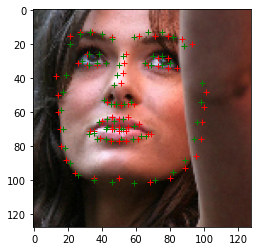

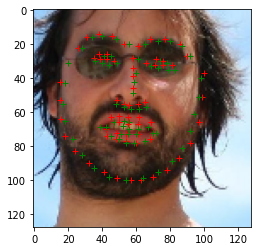

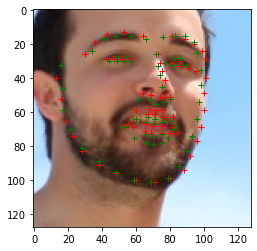

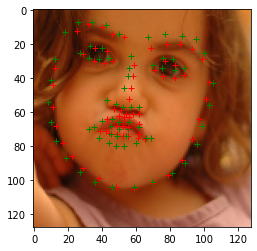

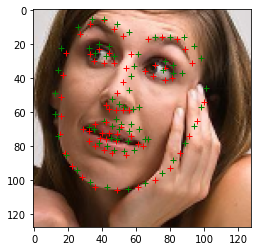

...

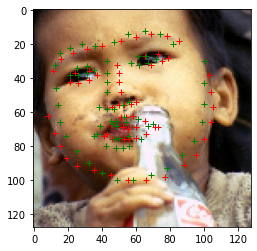

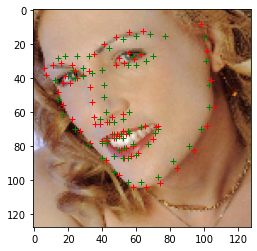

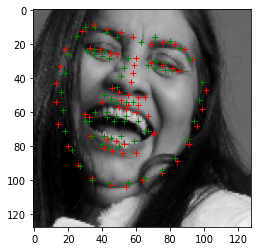

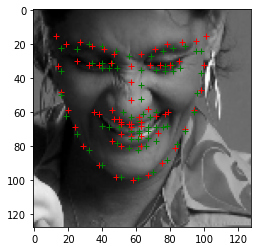

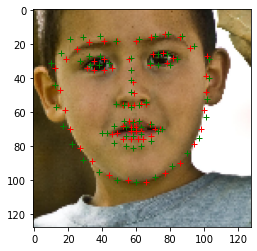

In [18]:
for j in range(12):

    plt.figure()
    plt.imshow(h_data[j][0])
    for k,i in enumerate(mean)  :
        plt.plot(int(h_data[j][1][k][0]), int(h_data[j][1][k][1]), 'r+')
        #plt.plot(int(i[0]), int(i[1]), 'b+')
        plt.plot(int(delta_reshape[j][k][0]) + int(i[0]),int(delta_reshape[j][k][1]) + int(i[1]), 'g+')
        #print(int(i[0]))

plt.show()

Evaluation

In [19]:
data_test = parse_file("helen_testset")
h_data_test = np.array(homogeneous_data(data_test))
matrix_test = construct_sift_matrix(h_data_test,h_data_test[:,1])
print(matrix_test.shape)


(330, 8704)


In [20]:

X_test = matrix_test.dot(projection_matrix.T)
Ytilde_test = np.column_stack((X_test,np.ones(X_test.shape[0])))
delta_test = Ytilde_test.dot(Ro)
delta_reshape_test = delta_test.reshape((delta_test.shape[0],68,2))

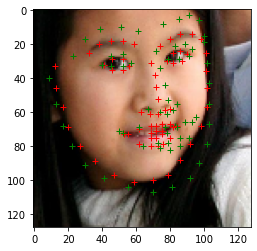

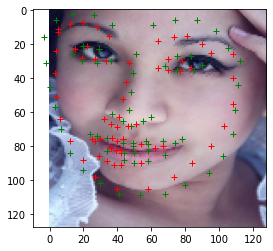

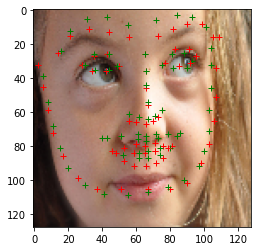

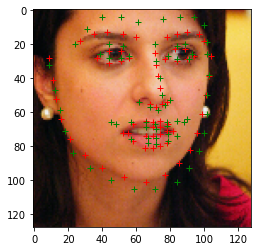

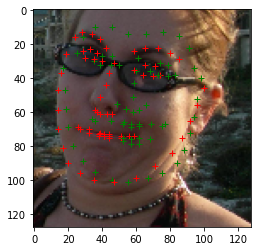

...

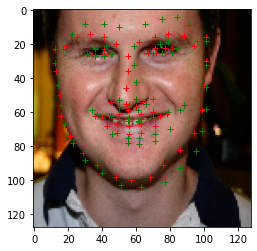

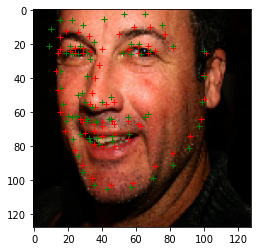

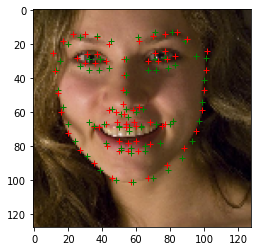

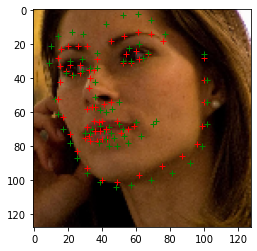

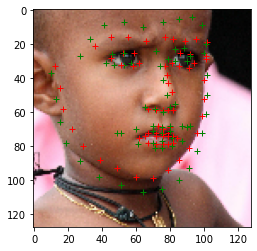

In [22]:
for j in range(11):

    plt.figure()
    plt.imshow(h_data_test[j][0])
    for k,i in enumerate(mean)  :
        plt.plot(int(h_data_test[j][1][k][0]), int(h_data_test[j][1][k][1]), 'r+')
        plt.plot(int(delta_reshape_test[j][k][0]) + int(i[0]),int(delta_reshape_test[j][k][1]) + int(i[1]), 'g+')
        #plt.plot(int(i[0]), int(i[1]), 'b+')

plt.show()

CASCADE REGRESSION

Training

In [23]:
h_data[0][1].shape

(68, 2)

In [24]:
caracteristics_points_to_keyPoint(h_data[0:1,:][0][1]).shape

(68,)

In [25]:
models = []
s = np.array(h_data)[:,1]
print(s.shape)
for i in range(4):
    models.append(oneStepAlignment(h_data[:,:],s,i))
    if i == 0:        
        s = majPoints(models[i][0],models[i][3])
    else:
        s = majPoints(s,models[i][0])
    print(s.shape)
#delta_reshape,projection_matrix,Ro,mean

(3148,)
(3148, 68, 2)
(3148, 68, 2)
(3148, 68, 2)
(3148, 68, 2)


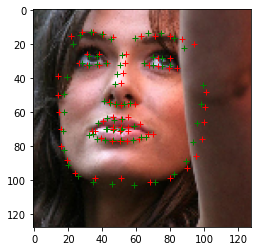

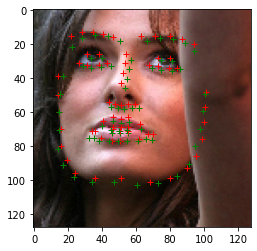

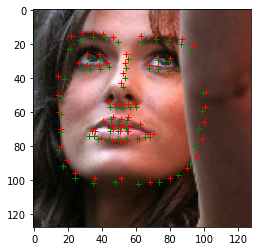

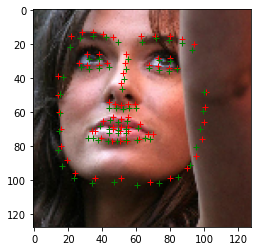

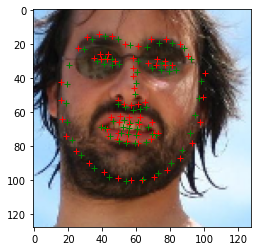

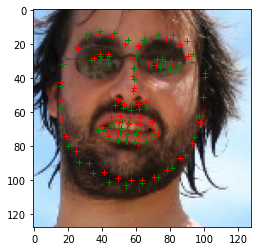

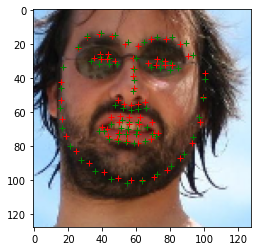

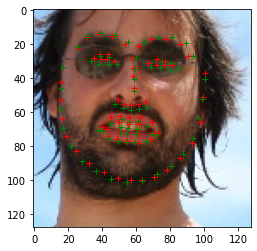

In [32]:
for j in range(2):

    mean = models[0][3]
    for i in range(4):  
        plt.figure()
        plt.imshow(h_data[j][0])
        cp = mean.copy()
        mean = []
        for k,z in enumerate(cp)  :
            #plt.plot(z[0],z[1],'b+')
            plt.plot(h_data[j][1][k][0], int(h_data[j][1][k][1]), 'r+')

            plt.plot(models[i][0][j][k][0] + z[0],models[i][0][j][k][1] + z[1], 'g+')
            mean.append([models[i][0][j][k][0] + z[0],models[i][0][j][k][1] + z[1]])
plt.show()

Evaluation


In [27]:
h_data_test[0].shape

(2,)

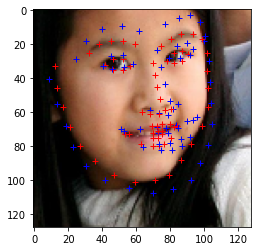

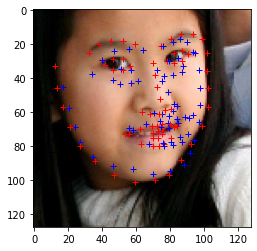

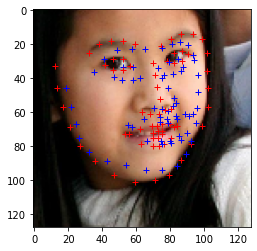

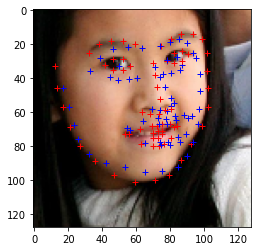

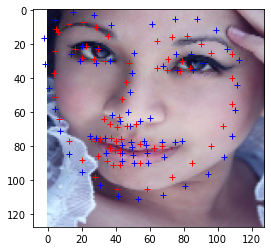

...

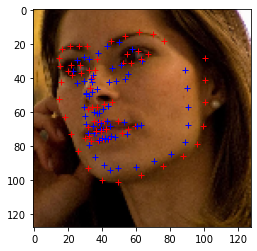

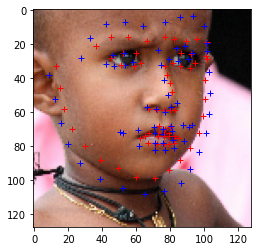

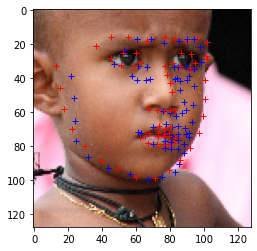

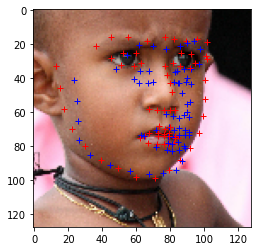

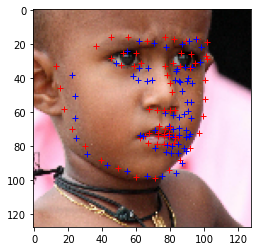

In [31]:
#    return delta_reshape,projection_matrix,Ro,mean
for j in range(11):
    mean = models[0][3]      
    for i in range(4):  
        plt.figure()
        plt.imshow(h_data_test[j][0])
        matrix_test = np.array(compute_sift_descriptors(h_data_test[j][0],caracteristics_points_to_keyPoint(mean)))
        matrix_test = matrix_test.reshape(1,matrix_test.shape[0])
        X_test = matrix_test.dot(models[i][1].T)   
        Ytilde_test = np.column_stack((X_test,np.ones(X_test.shape[0])))
        delta_test = Ytilde_test.dot(models[i][2])
        delta_reshape_test = delta_test.reshape((delta_test.shape[0],68,2))
        cp = mean.copy()
        mean = [] 
        for k,z in enumerate(cp)  :
            plt.plot(h_data_test[j][1][k][0], int(h_data_test[j][1][k][1]), 'r+')
            plt.plot(delta_reshape_test[0][k][0] + z[0],delta_reshape_test[0][k][1] + z[1], 'b+')
            #plt.plot(int(i[0]), int(i[1]), 'b+')
            mean.append([delta_reshape_test[0][k][0] + z[0],delta_reshape_test[0][k][1] + z[1]])


plt.show()